# ノイズデータ作成
- gapなし非定常ノイズデータを生成

In [1]:
DEBUG = True
#DEBUG = False

OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/tmp_noise"
#OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex007_generating_noise_non_stationary"
IS_DEL_OUTDIR = True

#TMP_OUTDIR = "my_generating_noise_1"
TMP_OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/PyFstat_tmp_files/my_generating_noise_2"

GAP_N_LEN = 200

In [2]:
# Parameters
TMP_OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/PyFstat_tmp_files/my_generating_noise_2"
OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex007_generating_noise_nonstationary1000"
GAP_N_LEN = 1000
IS_DEL_OUTDIR = True
DEBUG = False


In [3]:
#!pip install h5py
#!pip install pandas
import h5py
import pandas as pd

In [4]:
import os
import glob
import shutil
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from scipy import stats

import pyfstat
from pyfstat.utils import get_sft_as_arrays

# Local module to simplify plotting
import tutorial_utils

logger = pyfstat.set_up_logger(label=TMP_OUTDIR, log_level="INFO")

%matplotlib inline

22-11-26 16:20:24.087 pyfstat INFO    : Running PyFstat version 1.18.1+84.5ded4a67.clean


22-11-26 16:20:24.163 pyfstat.utils.importing INFO    : No $DISPLAY environment variable found, so importing matplotlib.pyplot with non-interactive 'Agg' backend.


In [5]:
# ================================================
# 生成したhdf5ファイルロードできるか確認
# ================================================
import h5py
from pathlib import Path

def load_hdf5(h_path):
    """hdf5ファイルロード"""
    with h5py.File(h_path, 'r') as f:
        g = f[file_id]

        # [:]を最後につけないと取り出せないので注意
        freq = g['frequency_Hz'][:]  # shape: (360,) 各振動数

        h1_a = g["H1"]['SFTs'][:]
        h1_t = g["H1"]['timestamps_GPS'][:]

        l1_a = g["L1"]['SFTs'][:]
        l1_t = g["L1"]['timestamps_GPS'][:]
    
    return freq, h1_a, l1_a, h1_t, l1_t

# gen_non_stationary_noise

In [6]:
def gen_non_stationary_noise_detectors(out_path, file_id, min_sqrtSX, F0, n_segment, tstart, detectors, r_segment=4.0):
    """detectors指定して非定常ノイズデータを生成
    gapノイズ(timestamps)は非定常のsegmentと併用できなかった
    """
    
    # Setup Writer
    writer_kwargs = {
        "outdir": TMP_OUTDIR,
        "duration": 30 * 4 * 24 * 3600,  #5 * 86400,  # 継続時間[秒］。4ヶ月
        "detectors": detectors,  # シミュレーションする検出器(ここではLIGOハンフォード)
        "Tsft": 1800,  # フーリエ変換の継続時間
        "SFTWindowType": "tukey",  # 短時間フーリエ変換を計算するための窓関数
        "SFTWindowBeta": 0.01,  # 窓関数に関連するパラメータ。0.01, 0.001 どちらでも変わらんらしい(https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#2003112
        
        "tstart": tstart,  # 観測開始時刻 [GPS時刻]

        # コンペデータの振動数の範囲内でバンドの中心周波数ランダムに変える
        "F0": F0,  # 生成するバンドの中心周波数 [Hz]. [F0 - Band/2, F0 + Band/2]
        "Band": 0.5,  # F0付近の周波数帯域幅 [Hz]
    }
    
    # =================================================
    # めちゃくちゃ中間ファイル作られるから実行前にきれいにする
    # =================================================
    if os.path.exists(TMP_OUTDIR):
        shutil.rmtree(TMP_OUTDIR)
        os.mkdir(TMP_OUTDIR)
    
    # =================================================
    # 非定常なノイズにするため振幅の強さランダムに変える
    # =================================================
    segment_sqrtSX = []
    for segment in range(n_segment):
        # r倍まで変える
        r = 1.0 + np.random.rand()/r_segment  # 1~1.xxx程度の範囲で動かすレベルが良さそうだった。大きすぎるとtestと似た画像にならないっぽい
        segment_sqrtSX.append( min_sqrtSX*r ) 
    
    # =================================================
    # 継続時間[秒］変更するduration
    # =================================================
    duration_MAX = writer_kwargs["duration"]
    segment_idxs = sorted(np.random.choice(list(range(5760)), n_segment, replace=False)) # 5760(=4*30*24*3600/1800)タイムスタンプの最大長さ
    segment_lengths = [segment_idxs[0]*1800]
    for i in range(1, n_segment):
        segment_lengths.append( segment_idxs[i]*1800 - segment_idxs[i - 1]*1800 )  
    segment_lengths.append( duration_MAX - segment_idxs[-1]*1800 )
    #print("segment_lengths:", sum(segment_lengths)/(24 * 3600), segment_lengths)

    # =================================================
    # duration単位でデータ生成
    # =================================================
    sft_path = []  # リストにsftファイルを詰めて";"で連結したら1ファイルで出力可能
    for segment in range(n_segment):
        # パラメータ変更
        writer_kwargs["label"] = f"segment_{segment}"
        writer_kwargs["duration"] = segment_lengths[segment]
        writer_kwargs["sqrtSX"] = segment_sqrtSX[segment]
        
        # 観測開始時刻 [GPS時刻] をずらす
        if segment > 0:
            writer_kwargs["tstart"] += writer_kwargs["Tsft"] + segment_lengths[segment - 1]
    
        # データ生成
        writer = pyfstat.Writer(**writer_kwargs)
        writer.make_data()
        
        # sftファイルをリストに詰める
        sft_path.append(writer.sftfilepath)
    
    sft_path = ";".join(sft_path)  # ; で異なるファイルを結合
    frequency, timestamps, fourier_data = get_sft_as_arrays(sft_path)  # SFTデータをnumpyの配列に読み込み
    
    return frequency, timestamps, fourier_data


def gen_non_stationary_noise(out_path, file_id, F0, min_sqrtSX=1e-24, max_n_segment=10, r_segment=4.0):
    """非定常ノイズデータを生成してhdf5に保存する
    gapノイズ(timestamps)は非定常のsegmentと併用できなかった
    """
    for _ in range(10):  # segmentアリだと4096未満になるときあるので対策
        
        # 関係ないと思うが一応時刻もランダムに変えとく
        tstart = np.random.randint(1238166018,1248724262)  # 観測開始時刻 [GPS時刻]

        # 最大n_segment回振幅の強さ変える
        n_segment = np.random.randint(1,max_n_segment+1)

        # h1とl1で非定常ノイズにするためにそれぞれでデータ生成
        frequency, timestamps_h1, fourier_data_h1 = gen_non_stationary_noise_detectors(out_path, file_id, min_sqrtSX, F0, n_segment, tstart, "H1", r_segment=r_segment)
        frequency, timestamps_l1, fourier_data_l1 = gen_non_stationary_noise_detectors(out_path, file_id, min_sqrtSX, F0, n_segment, tstart, "L1", r_segment=r_segment)

        # =================================================
        # 対象の周波数帯域の 0.2 の範囲だけスライス
        # =================================================
        # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#1987496
        first_index = np.argmin( np.abs( frequency - F0 ) )
        last_index = np.argmin( np.abs( frequency - (F0 + 0.2) ) )
        frequency = frequency[first_index:last_index+1]
        h1_amp = fourier_data_h1["H1"][first_index:last_index + 1, :]
        l1_amp = fourier_data_l1["L1"][first_index:last_index + 1, :]

        # 360の長さまでにしておく（361になるときがあるので）
        frequency = frequency[:360]
        h1_amp = h1_amp[:360,:]
        l1_amp = l1_amp[:360,:]
        
        if (len(timestamps_h1["H1"]) >= 4096) and (len(timestamps_l1["L1"]) >= 4096):
            break

    # =================================================
    # HDF5ファイルの作成
    # =================================================
    if (len(timestamps_h1["H1"]) >= 4096) and (len(timestamps_l1["L1"]) >= 4096):
                                                           
        with h5py.File(f"{out_path}", "w") as h5:
            g = h5.create_group(str(file_id))
            g.create_dataset('frequency_Hz', data=frequency)

            g_h = g.create_group("H1")
            g_h.create_dataset('SFTs', data=h1_amp)
            g_h.create_dataset('timestamps_GPS', data=timestamps_h1["H1"])

            g_l = g.create_group("L1")
            g_l.create_dataset('SFTs', data=l1_amp)
            g_l.create_dataset('timestamps_GPS', data=timestamps_l1["L1"])
    
    return frequency, timestamps_h1["H1"], timestamps_l1["L1"], h1_amp, l1_amp

In [7]:
debug = False
#debug = True
if debug:
    #frequency, h1_ts, l1_ts, h1_amp, l1_amp = gen_non_stationary_noise(f"./tmp/tmp.hdf5", "tmp", 150, min_sqrtSX=1e-24, max_n_segment=30, r_segment=10.0)
    frequency, h1_ts, l1_ts, h1_amp, l1_amp = gen_non_stationary_noise(f"./tmp/tmp.hdf5", "tmp", 150, min_sqrtSX=1e-24, max_n_segment=30, r_segment=2.0)
    from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
    clear_output()

In [8]:
if debug:
    
    h_path = f"./tmp/tmp.hdf5"
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)

In [9]:
def show_1img_2ch(p_h1, p_l1, ts_h1, ts_l1, f, y, is_show, save_path="", figsize=(18, 5)):
    
    #p_h1, p_l1 = p_h1 * 255, p_l1 * 255
    
    plt.figure(figsize=figsize)

    #print(p_h1.max(), p_l1.max())
    #print(ts_h1, ts_l1, f.max(), f.min())
    
    if figsize[0] > figsize[1]:
        plt.subplot(2, 1, 1)
    else:
        plt.subplot(1, 2, 1)
    plt.title(f'H1 Spectrogram y:{y}')
    plt.xlabel('time')
    plt.ylabel('frequency')
    plt.imshow(p_h1)  # , extent=[ts_h1.min(), ts_l1.max(), f.max(), f.min()]
    plt.colorbar()

    if figsize[0] > figsize[1]:
        plt.subplot(2, 1, 2)
    else:
        plt.subplot(1, 2, 2)
    plt.title(f'L1 Spectrogram y:{y}')
    plt.xlabel('time')
    plt.ylabel('frequency')
    plt.imshow(p_l1)
    plt.colorbar()

    if save_path != "":
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0)
    
    if is_show:
        plt.tight_layout()
        plt.show()
    plt.clf()  # メモリ解放
    plt.close()

def get_hdf5(h_path, y, 
             is_gap=False,
             is_p_mean=False,
             is_show=False, 
             save_dir="", 
             f_coff=2.9e-21):
    file_id = Path(h_path).stem
    with h5py.File(h_path, 'r') as f:
        g = f[file_id]
        
        f = g['frequency_Hz'][:]  # Dataset型なので[:]付けたらnpになる
        
        ts_h1 = g["H1"]['timestamps_GPS'][:]  # Dataset型なので[:]付けたらnpになる
        ts_l1 = g["L1"]['timestamps_GPS'][:]  # Dataset型なので[:]付けたらnpになる
        #ts_h1 = [ts2time(ts) for ts in ts_h1]
        #ts_l1 = [ts2time(ts) for ts in ts_l1]
        
        a_h1 = g["H1"]['SFTs'][:]  # Dataset型なので[:]付けたらnpになる
        a_l1 = g["L1"]['SFTs'][:]  # Dataset型なので[:]付けたらnpになる
        
        a_h1_norm = a_h1 / f_coff
        p_h1 = a_h1_norm.real**2 + a_h1_norm.imag**2
        #p_h1 /= np.mean(p_h1)  # normalize
        
        a_l1_norm = a_l1 / f_coff
        p_l1 = a_l1_norm.real**2 + a_l1_norm.imag**2
        #p_l1 /= np.mean(p_l1)  # normalize
        
        if is_p_mean:
            # パワースペクトルはtimestepsごとに平均化. compress 4096 -> 128
            p_h1 = p_h1[:, :4096]
            p_l1 = p_l1[:, :4096]
            p_h1 = np.mean(p_h1.reshape(360, 128, 4096//128), axis=2)
            p_l1 = np.mean(p_l1.reshape(360, 128, 4096//128), axis=2)
            figsize = (10, 10)
        else:
            figsize = (18, 5)
        
        if is_show or save_dir != "":
            show_1img_2ch(p_h1, p_l1, ts_h1, ts_l1, f, y, is_show,
                          save_path=f"{save_dir}/{Path(h_path).stem}_{str(y)}.png", 
                          figsize=figsize,
                         )
        
        return file_id, f, ts_h1, ts_l1, a_h1, a_l1, p_h1, p_l1

In [10]:
if debug:
    file_id, f, ts_h1, ts_l1, a_h1, a_l1, p_h1, p_l1 = get_hdf5(f"./tmp/tmp.hdf5", 0, 
                                                                is_p_mean=True,
                                                                is_show=True,
                                                                save_dir="tmp",
                                                               )
    print(p_h1.max(), p_l1.max())

In [11]:
#=====

# gen_gap_noise

In [12]:
def gen_gap_noise_detectors(out_path, file_id, sqrtSX, F0, prob_gap, detectors):
    """detectors指定してgapノイズデータを生成
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    
    # Setup Writer
    writer_kwargs = {
        "outdir": TMP_OUTDIR,
        #"duration": 30 * 4 * 24 * 3600,  #5 * 86400,  # 継続時間[秒］。4ヶ月

        "detectors": detectors,  # シミュレーションする検出器(ここではLIGOハンフォード)
        
        "Tsft": 1800,  # フーリエ変換の継続時間
        "SFTWindowType": "tukey",  # 短時間フーリエ変換を計算するための窓関数
        "SFTWindowBeta": 0.01,  # 窓関数に関連するパラメータ。0.01, 0.001 どちらでも変わらんらしい(https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#2003112

        ## 関係ないと思うが一応時刻もランダムに変えとく
        #"tstart": np.random.randint(1238166018,1248724262),  # 観測開始時刻 [GPS時刻]
        
        "sqrtSX": sqrtSX,  # 雑音の片側振幅スペクトル密度
        
        # コンペデータの振動数の範囲内でバンドの中心周波数ランダムに変える
        "F0": F0,  # 生成するバンドの中心周波数 [Hz]. [F0 - Band/2, F0 + Band/2]
        "Band": 0.5,  # F0付近の周波数帯域幅 [Hz]
    }
    
    # =================================================
    # 中間ファイル作られるから実行前にきれいにする
    # =================================================
    if os.path.exists(TMP_OUTDIR):
        shutil.rmtree(TMP_OUTDIR)
        os.mkdir(TMP_OUTDIR)
    
    # =================================================
    # 各 GPS タイムスタンプのリスト。リストの要素間の飛びの時間はデータが存在しない「ギャップ」になる
    # =================================================
    max_gap_sec = (4*30 - 81) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最小は81日間
    #min_gap_sec = (4*30 - 101) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最大は101日間    
    gap_sum = 0
    if detectors == "H1":
        # h1のタイムスタンプの数
        n_idxs = np.random.randint(4281, 4887+1)  # test setのタイムスタンプの数より
        timestamps = [ np.random.randint(1238166018, 1238240175) ]  # 観測開始時刻 [GPS時刻]
    else:
        # l1のタイムスタンプの数
        n_idxs = np.random.randint(4297, 4878+1)  # test setのタイムスタンプの数より
        timestamps = [ np.random.randint(1238166019, 1238222656) ]  # 観測開始時刻 [GPS時刻]
    #for idx in range(5760): # 5760(=4*30*24*3600/1800)タイムスタンプの最大長さ
    for idx in range(n_idxs):
        # prob_gapの確率でgap入れる
        if ( np.random.rand() > 1 - prob_gap ) and ( gap_sum+1 < max_gap_sec ):
            # 最低1秒gapありとした
            # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/358835#2026499
            inteval = np.random.randint(1, 105026+1)  # test setのgapの最大は105026sec
            gap_sum += inteval
        else:
            inteval = 1800
        timestamps += [timestamps[-1] + inteval]
    #print("timestamps:", list( np.array(timestamps[1:])-np.array(timestamps[:-1]) ))
    writer_kwargs["timestamps"] = np.array(timestamps)
    
    # =================================================
    # データ生成
    # =================================================
    # Create SFTs
    writer = pyfstat.Writer(**writer_kwargs)
    writer.make_data()
    
    # SFTデータをnumpyの配列に読み込み
    frequency, timestamps, fourier_data = get_sft_as_arrays(writer.sftfilepath)
    
    return frequency, timestamps, fourier_data


def gen_gap_noise(out_path, file_id, sqrtSX, F0, prob_gap=0.01):
    """gapノイズデータを生成してhdf5に保存する
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    
    # h1とl1で異なるgapにするためにそれぞれでデータ生成
    frequency, timestamps_h1, fourier_data_h1 = gen_gap_noise_detectors(out_path, file_id, sqrtSX, F0, prob_gap, "H1")
    frequency, timestamps_l1, fourier_data_l1 = gen_gap_noise_detectors(out_path, file_id, sqrtSX, F0, prob_gap, "L1")
    
    # =================================================
    # 対象の周波数帯域の 0.2 の範囲だけスライス
    # =================================================
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#1987496
    first_index = np.argmin( np.abs( frequency - F0 ) )
    last_index = np.argmin( np.abs( frequency - (F0 + 0.2) ) )
    frequency = frequency[first_index:last_index+1]
    h1_amp = fourier_data_h1["H1"][first_index:last_index + 1, :]
    l1_amp = fourier_data_l1["L1"][first_index:last_index + 1, :]
    
    # 360の長さまでにしておく（361になるときがあるので）
    frequency = frequency[:360]
    h1_amp = h1_amp[:360,:]
    l1_amp = l1_amp[:360,:]
    
    # =================================================
    # HDF5ファイルの作成
    # =================================================
    with h5py.File(f"{out_path}", "w") as h5:
        g = h5.create_group(str(file_id))
        g.create_dataset('frequency_Hz', data=frequency)
        
        g_h = g.create_group("H1")
        g_h.create_dataset('SFTs', data=h1_amp)
        g_h.create_dataset('timestamps_GPS', data=timestamps_h1["H1"])
        
        g_l = g.create_group("L1")
        g_l.create_dataset('SFTs', data=l1_amp)
        g_l.create_dataset('timestamps_GPS', data=timestamps_l1["L1"])
    
    return frequency, timestamps_h1["H1"], timestamps_l1["L1"], h1_amp, l1_amp

# Main

In [13]:
# ================================================
# hdf5ファイル生成
# ================================================
def main(debug=True):
        
    def _gen_gap_noise(min_sqrtSX, max_sqrtSX, n_len, start_id=0):
        for i in range(n_len):
            F0 = np.random.randint(50,500) + np.random.rand()
            
            _n_max = int((max_sqrtSX - min_sqrtSX) / min_sqrtSX) + 1
            sqrtSX = np.random.randint(1,_n_max) * min_sqrtSX
            
            _sqrtSX = '{:.3g}'.format(sqrtSX)
            file_id = f"{start_id + i}_sqrtSX{_sqrtSX}_F0{str(round(F0,2))}_gap"
            out_path = f"{OUTDIR}/{file_id}.hdf5"

            frequency, h1_ts, l1_ts, h1_amp, l1_amp = gen_gap_noise(out_path, str(file_id), sqrtSX, F0)
            
    def _gen_non_stationary_noise(min_sqrtSX, max_sqrtSX, n_len, start_id=0):
        for i in tqdm(range(n_len)):
            F0 = np.random.randint(50,500) + np.random.rand()
            
            _n_max = int((max_sqrtSX - min_sqrtSX) / min_sqrtSX) + 1
            sqrtSX = np.random.randint(1,_n_max) * min_sqrtSX
            
            r_segment = np.random.randint(2,10+1)

            _sqrtSX = '{:.3g}'.format(sqrtSX)
            file_id = f"{start_id + i}_sqrtSX{_sqrtSX}_F0{str(round(F0,2))}_maxsegment30_rsegment{r_segment}"
            out_path = f"{OUTDIR}/{file_id}.hdf5"
            #print(out_path)

            # non_stationary_noiseは途中で失敗するときあるのでtryで囲む
            try:
                for _ in range(10):
                    frequency, h1_ts, l1_ts, h1_amp, l1_amp = gen_non_stationary_noise(out_path, str(file_id), F0, min_sqrtSX=sqrtSX, max_n_segment=30, r_segment=r_segment)
                    # segmentアリだと4096未満になるときあるので対策する
                    if (len(h1_ts) >= 4096) and (len(l1_ts) >= 4096):
                        break
            except:
                print("Error")
    
    if debug:
        gen_n_len = 1 
    else:
        gen_n_len = GAP_N_LEN

    
    ## 振幅の桁数変えたgap_noise
    #_gen_gap_noise(5e-24, 2e-22, gen_n_len, start_id=0)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    
    # 振幅の桁数変えたnon_stationary_noise
    _gen_non_stationary_noise(5e-24, 2e-22, gen_n_len, start_id=0)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    
    
if __name__ == '__main__':

    if IS_DEL_OUTDIR:
        if os.path.exists(OUTDIR):
            shutil.rmtree(OUTDIR)
    os.makedirs(f"{OUTDIR}", exist_ok=True)
        
    main(debug=DEBUG)
    

from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
clear_output()

In [14]:
_df = pd.DataFrame({"id": [Path(p).stem for p in sorted(glob.glob(f"{OUTDIR}/*segment*.hdf5"))], "target": 0})
_df.to_csv(OUTDIR + "/df.csv", index=False)

fmins, fmaxs = [], []
h1_hsizes, h1_wsizes = [], []
l1_hsizes, l1_wsizes = [], []
h1_amp_mins, h1_amp_maxs = [], []
l1_amp_mins, l1_amp_maxs = [], []
h1_tmins, h1_tmaxs = [], []
l1_tmins, l1_tmaxs = [], []
h1_max_intevals, l1_max_intevals = [], []
for _id in tqdm( _df["id"].to_numpy() ):
    h_path = f"{OUTDIR}/{_id}.hdf5"
    file_id = Path(h_path).stem
    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    
    fmins.append(freq.min())
    fmaxs.append(freq.max())
    
    h1_hsizes.append(h1_a.shape[0])
    h1_wsizes.append(h1_a.shape[1])
    
    l1_hsizes.append(l1_a.shape[0])
    l1_wsizes.append(l1_a.shape[1])
    
    h1_amp_mins.append(h1_a.min())
    h1_amp_maxs.append(h1_a.max())
    
    l1_amp_mins.append(l1_a.min())
    l1_amp_maxs.append(l1_a.max())

    h1_tmins.append(h1_t.min())
    h1_tmaxs.append(h1_t.max())
    
    l1_tmins.append(l1_t.min())
    l1_tmaxs.append(l1_t.max())
    
    h1_max_inteval = np.max(h1_t[1:]-h1_t[0:-1])
    l1_max_inteval = np.max(l1_t[1:]-l1_t[0:-1])
    h1_max_intevals.append(h1_max_inteval)
    l1_max_intevals.append(l1_max_inteval)

_df["freq min"] = fmins
_df["freq max"] = fmaxs
_df["H1 SFTs h"] = h1_hsizes
_df["H1 SFTs w"] = h1_wsizes
_df["H1 time min"] = h1_tmins
_df["H1 time max"] = h1_tmaxs
_df["H1 max inteval"] = h1_max_intevals
_df["L1 SFTs h"] = l1_hsizes
_df["L1 SFTs w"] = l1_wsizes
_df["L1 time min"] = l1_tmins
_df["L1 time max"] = l1_tmaxs
_df["L1 max inteval"] = l1_max_intevals
_df["freq_min//10"] = _df["freq min"]//10
_df["freq_min//10_target"] = _df["freq_min//10"].astype(str) + "_" + _df["target"].astype(str)
    
_df.to_csv(OUTDIR + "/df_summary.csv", index=False)
_df

  0%|          | 0/997 [00:00<?, ?it/s]

,id,target,freq min,freq max,H1 SFTs h,H1 SFTs w,H1 time min,H1 time max,H1 max inteval,L1 SFTs h,L1 SFTs w,L1 time min,L1 time max,L1 max inteval,freq_min//10,freq_min//10_target
0,0_sqrtSX1.75e-22_F0145.46_maxsegment30_rsegment3,0,145.462778,145.662222,360,5363,1246662852,1256318052,3600,360,5680,1246662852,1256888652,3600,14.0,14.0_0
1,100_sqrtSX4.5e-23_F0483.82_maxsegment30_rsegment7,0,483.822222,484.021667,360,5631,1246172048,1256342048,3600,360,5712,1246172048,1256487848,3600,48.0,48.0_0
2,101_sqrtSX1.5e-22_F0280.75_maxsegment30_rsegment2,0,280.745556,280.945000,360,5736,1239578488,1249937488,3600,360,5224,1239578488,1249015888,3600,28.0,28.0_0
3,102_sqrtSX1.1e-22_F0303.82_maxsegment30_rsegment3,0,303.825000,304.024444,360,5662,1239102110,1249338710,3600,360,5664,1239102110,1249342310,3600,30.0,30.0_0
4,103_sqrtSX1.1e-22_F0264.7_maxsegment30_rsegment4,0,264.695000,264.894444,360,5658,1247347635,1257537435,3600,360,5311,1247347635,1256912835,3600,26.0,26.0_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,997_sqrtSX2e-23_F0469.16_maxsegment30_rsegment8,0,469.163333,469.362778,360,5729,1243594131,1253947731,3600,360,5519,1243594131,1253569731,3600,46.0,46.0_0
993,998_sqrtSX5.5e-23_F0492.06_maxsegment30_rsegment3,0,492.063889,492.263333,360,5604,1243805959,1253916559,3600,360,5352,1243805959,1253462959,3600,49.0,49.0_0
994,999_sqrtSX4e-23_F0496.3_maxsegment30_rsegment4,0,496.297778,496.497222,360,5424,1246674874,1256454274,3600,360,4566,1246674874,1254909874,3600,49.0,49.0_0
995,99_sqrtSX8.5e-23_F0273.1_maxsegment30_rsegment8,0,273.098889,273.298333,360,5476,1241276031,1251159831,3600,360,5488,1241276031,1251181431,3600,27.0,27.0_0


# Check

(360,)
(360, 5363) (360, 5680)
(5363,) (5680,)
h1_t: [1246662852 1246664652 1246666452 ... 1256314452 1256316252 1256318052]
l1_t: [1246662852 1246664652 1246666452 ... 1256885052 1256886852 1256888652]
h1_t[0] - l1_t[0]: 0
h1 sum gap: 0.04 days
l1 sum gap: 0.04 days


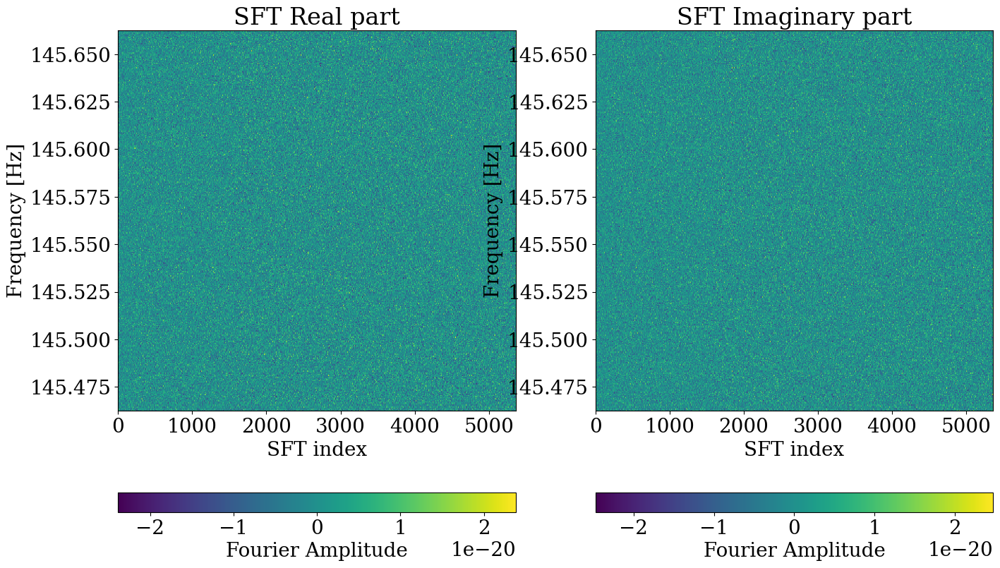

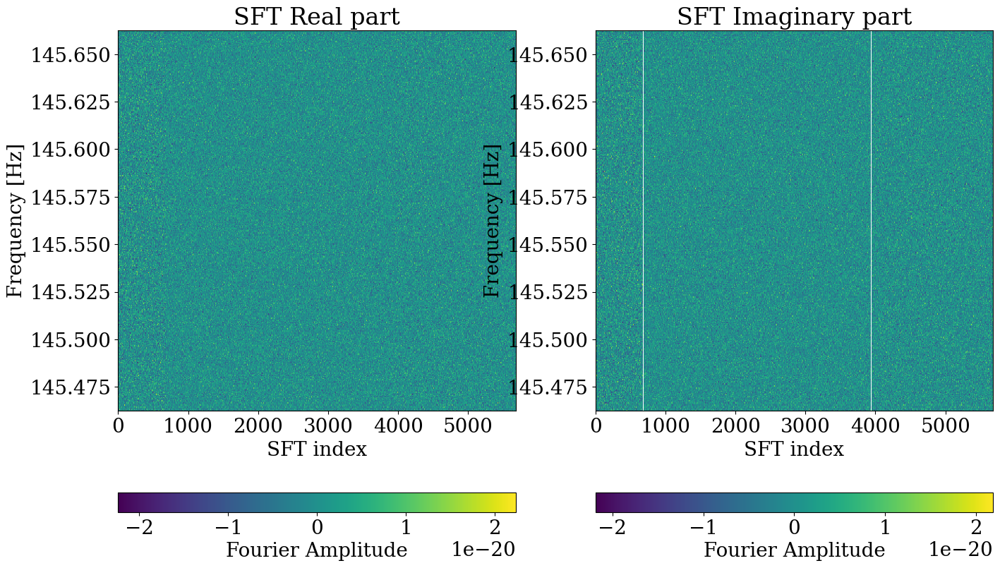

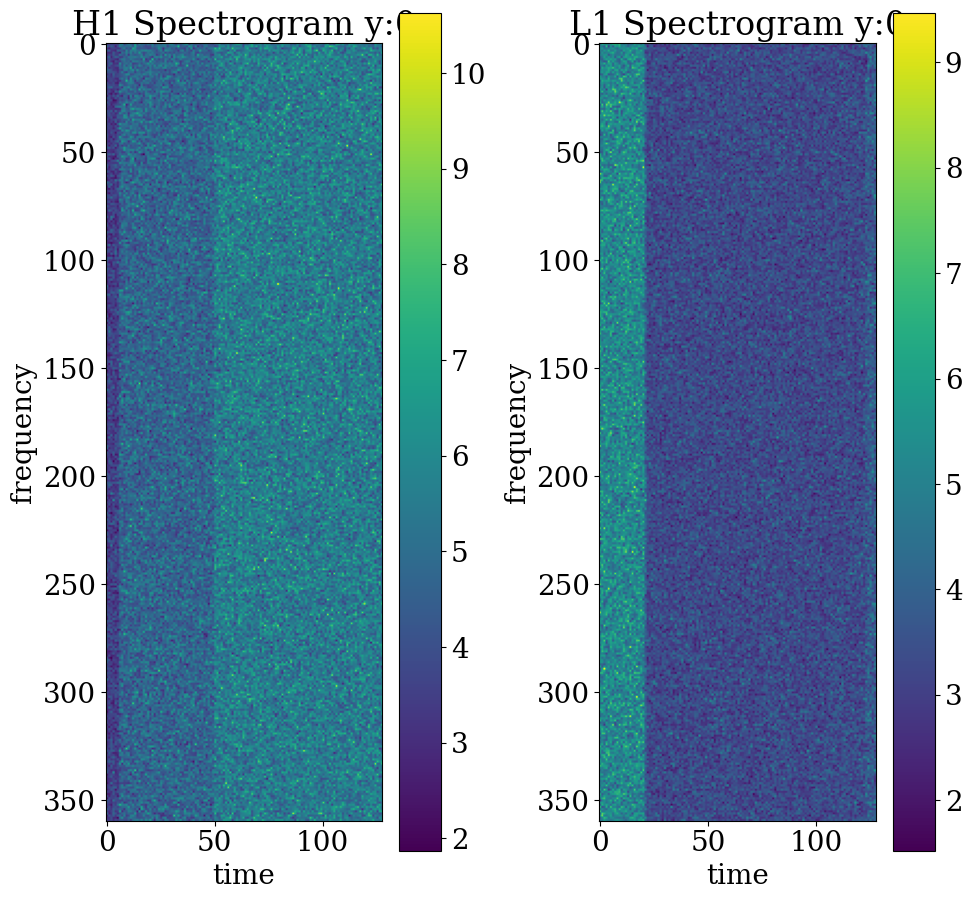

10.625277 9.465469


(360,)
(360, 5631) (360, 5712)
(5631,) (5712,)
h1_t: [1246172048 1246173848 1246175648 ... 1256338448 1256340248 1256342048]
l1_t: [1246172048 1246173848 1246175648 ... 1256484248 1256486048 1256487848]
h1_t[0] - l1_t[0]: 0
h1 sum gap: 0.42 days
l1 sum gap: 0.42 days


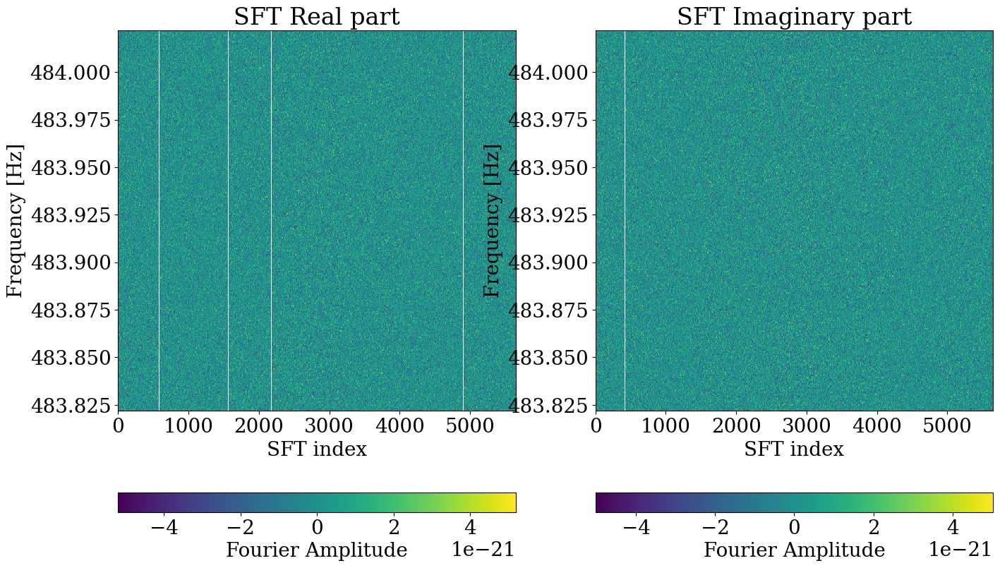

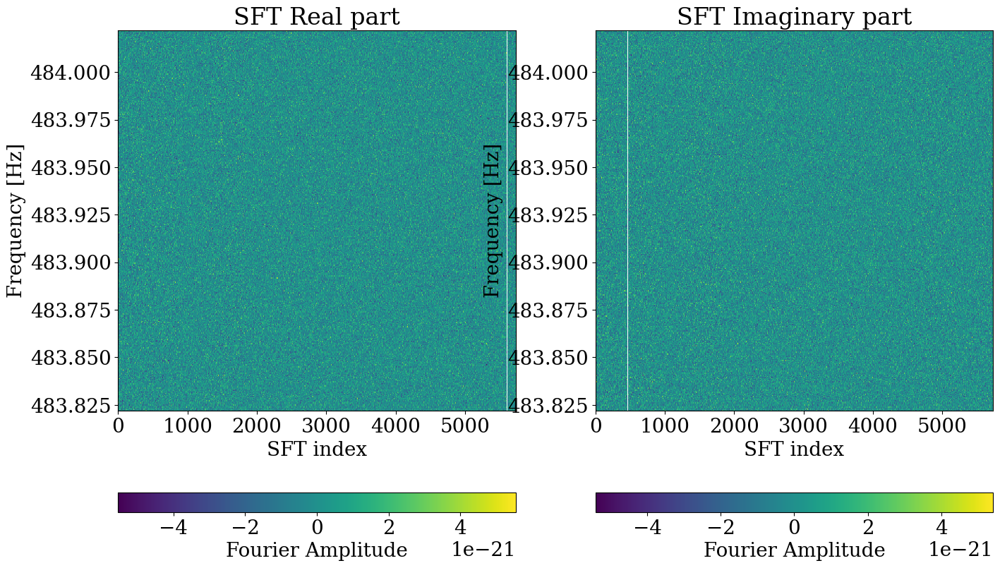

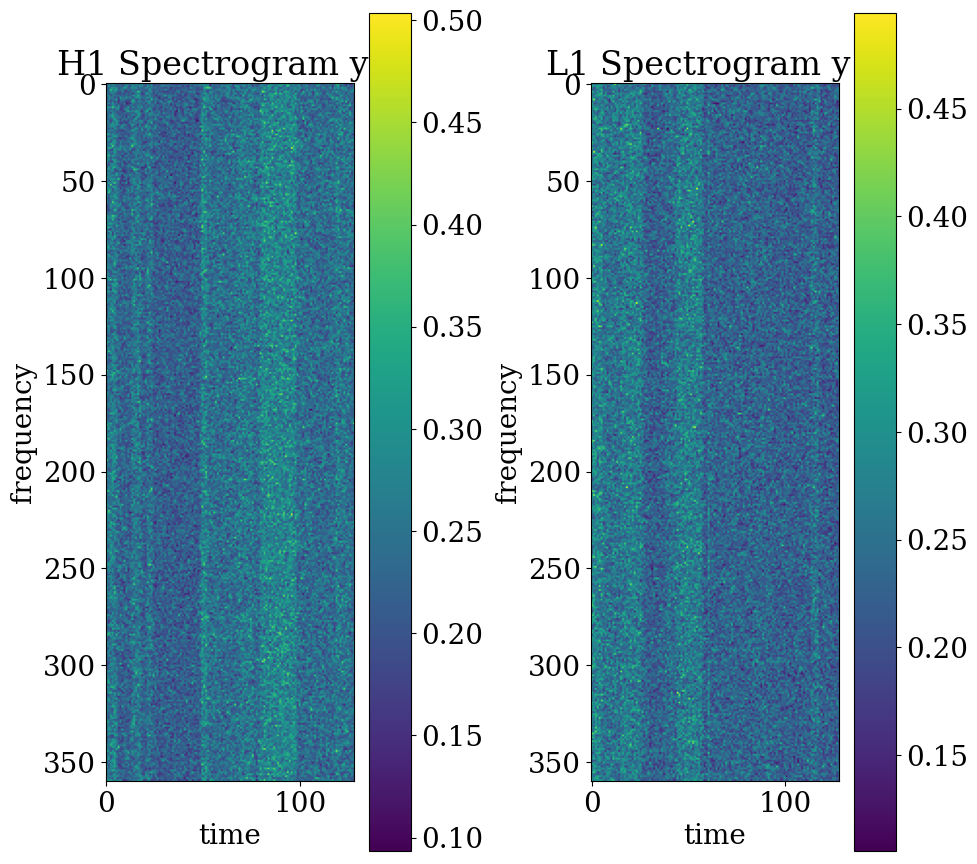

0.5034878 0.4942879


(360,)
(360, 5736) (360, 5224)
(5736,) (5224,)
h1_t: [1239578488 1239580288 1239582088 ... 1249933888 1249935688 1249937488]
l1_t: [1239578488 1239580288 1239582088 ... 1249012288 1249014088 1249015888]
h1_t[0] - l1_t[0]: 0
h1 sum gap: 0.42 days
l1 sum gap: 0.42 days


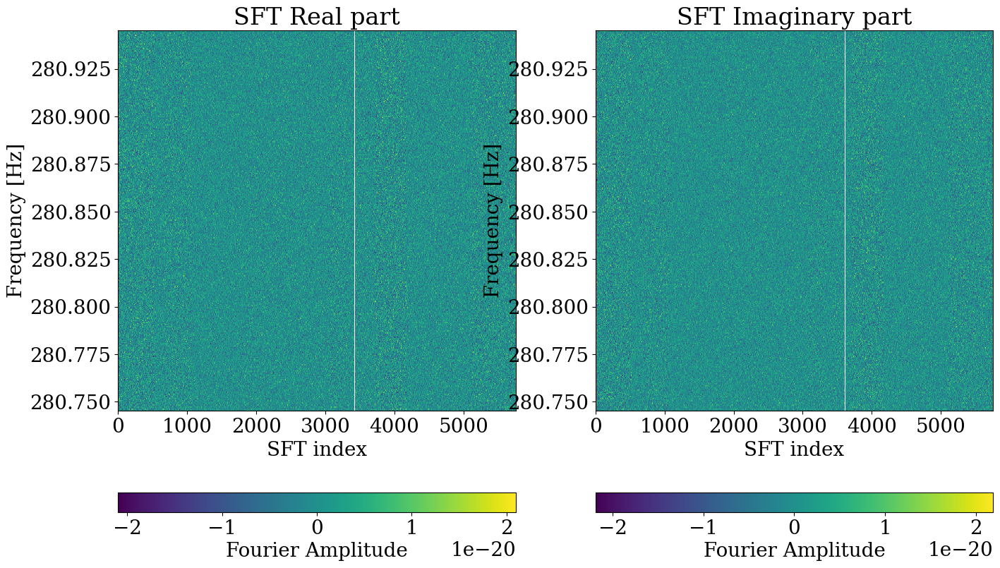

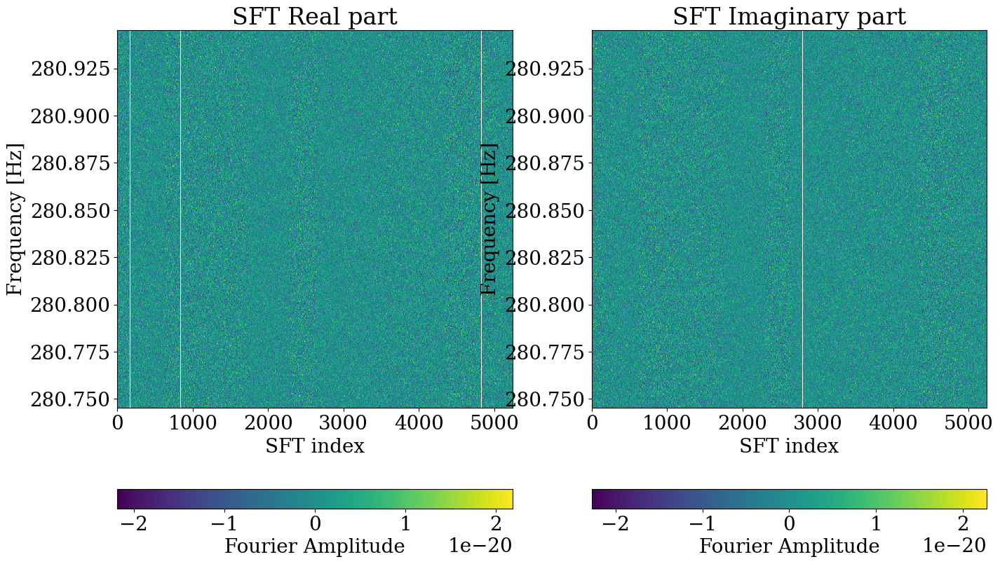

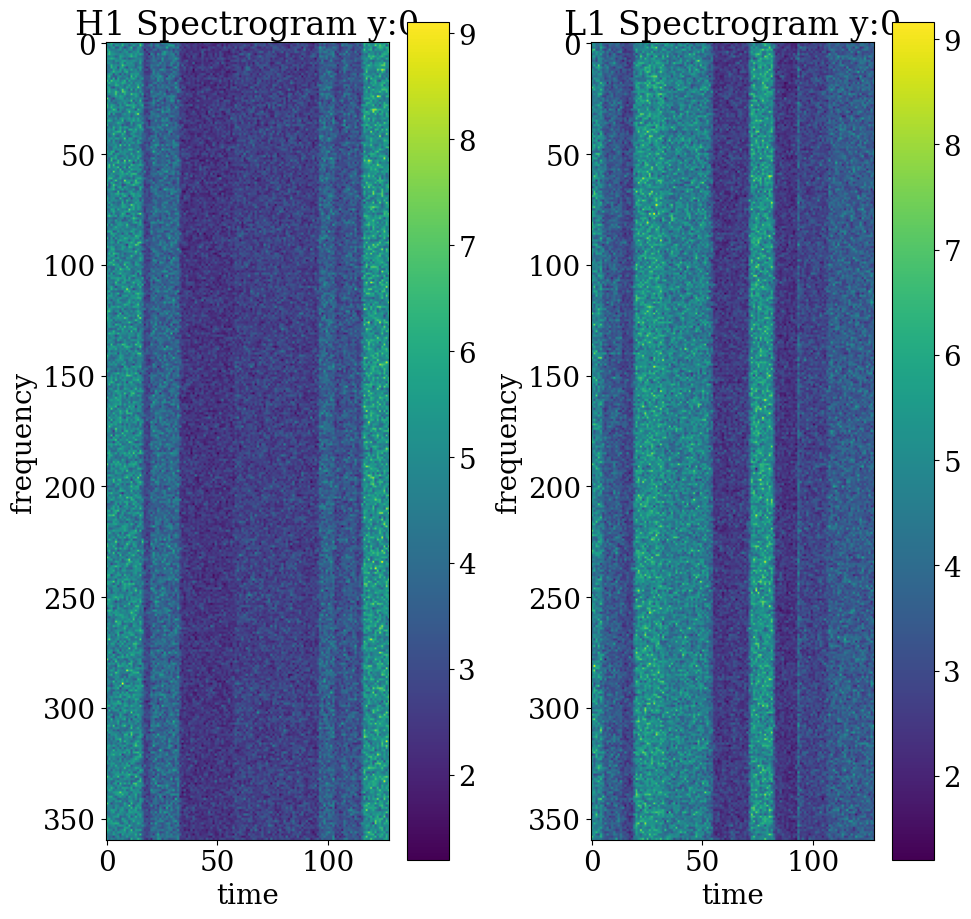

9.102881 9.160292


(360,)
(360, 5662) (360, 5664)
(5662,) (5664,)
h1_t: [1239102110 1239103910 1239105710 ... 1249335110 1249336910 1249338710]
l1_t: [1239102110 1239103910 1239105710 ... 1249338710 1249340510 1249342310]
h1_t[0] - l1_t[0]: 0
h1 sum gap: 0.54 days
l1 sum gap: 0.54 days


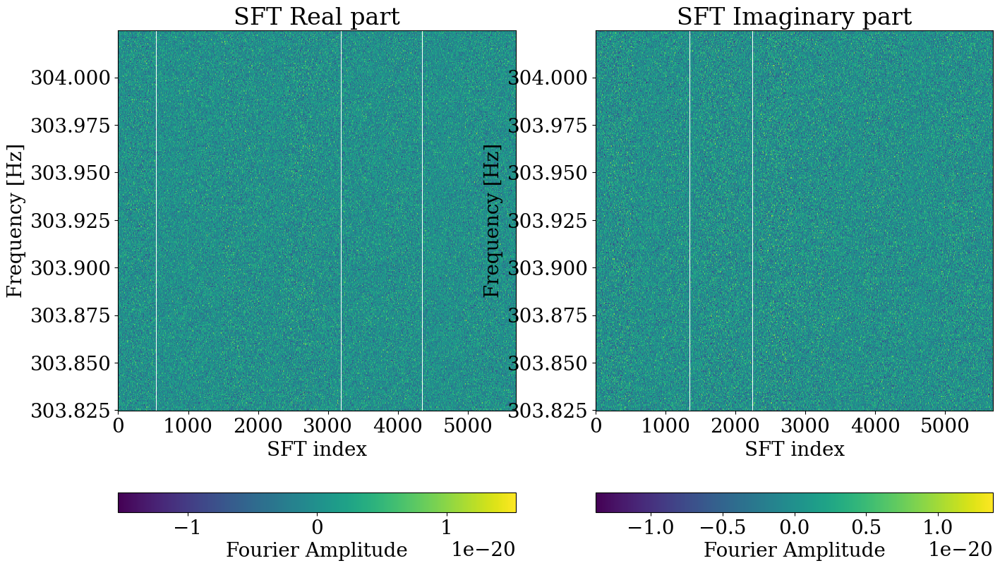

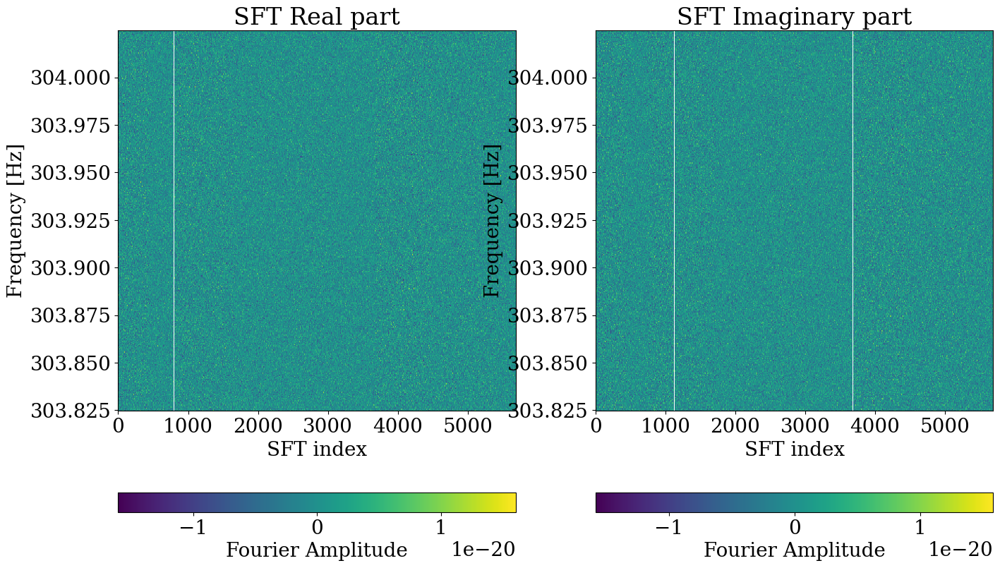

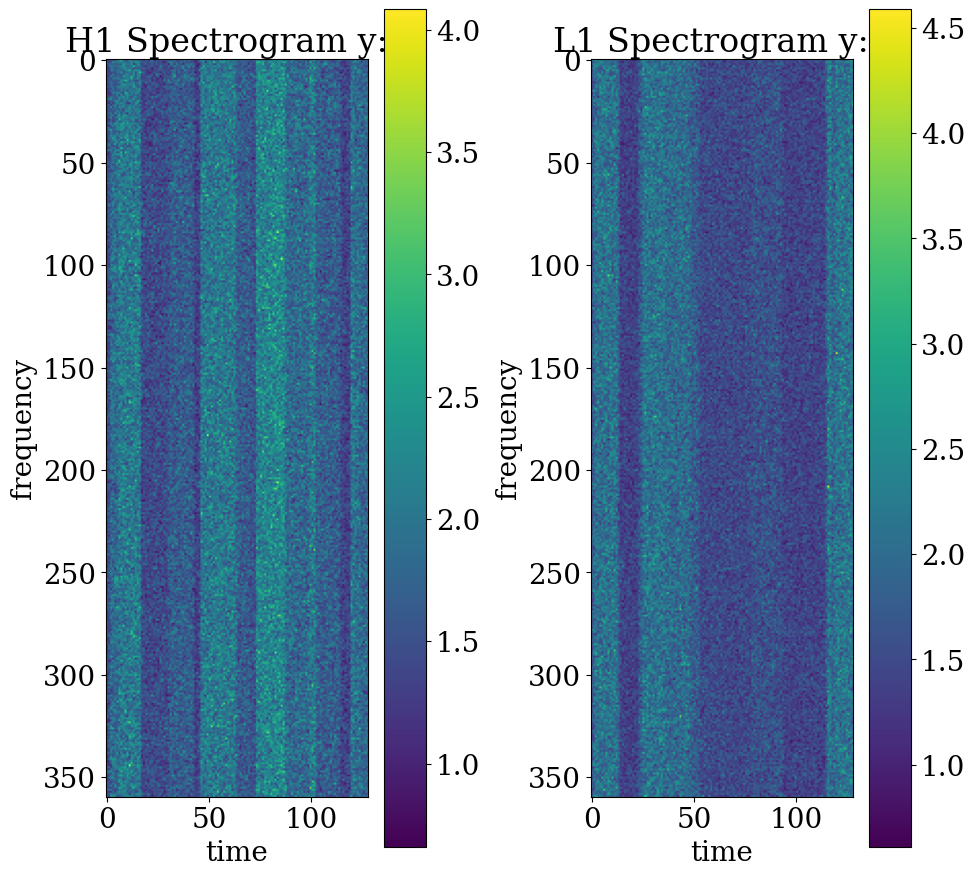

4.0834675 4.588835


(360,)
(360, 5658) (360, 5311)
(5658,) (5311,)
h1_t: [1247347635 1247349435 1247351235 ... 1257533835 1257535635 1257537435]
l1_t: [1247347635 1247349435 1247351235 ... 1256909235 1256911035 1256912835]
h1_t[0] - l1_t[0]: 0
h1 sum gap: 0.08 days
l1 sum gap: 0.08 days


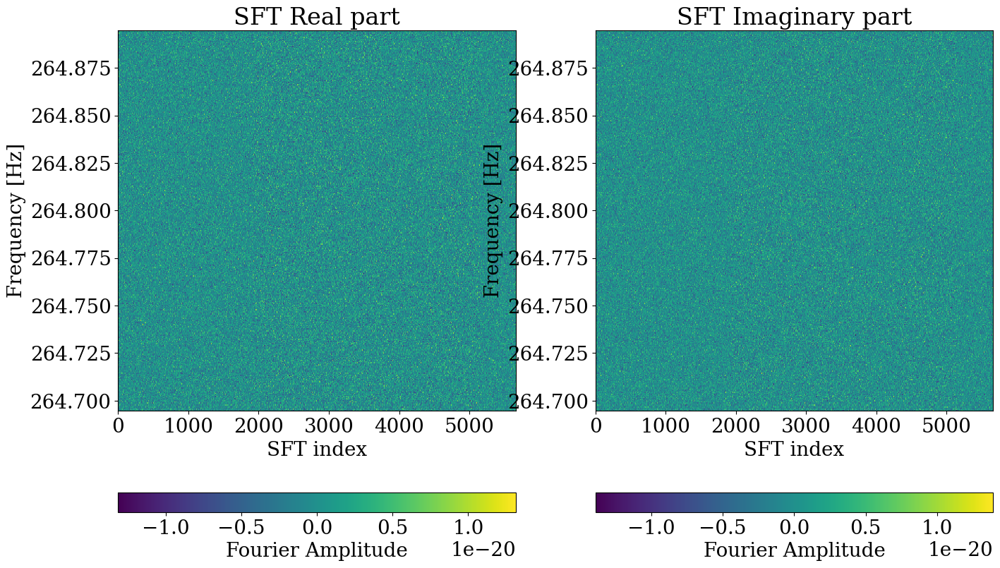

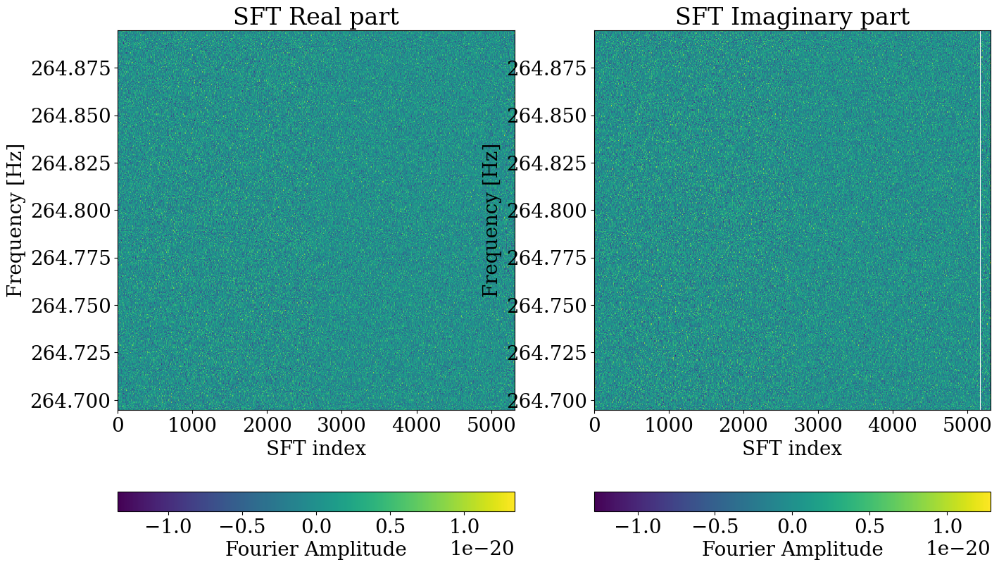

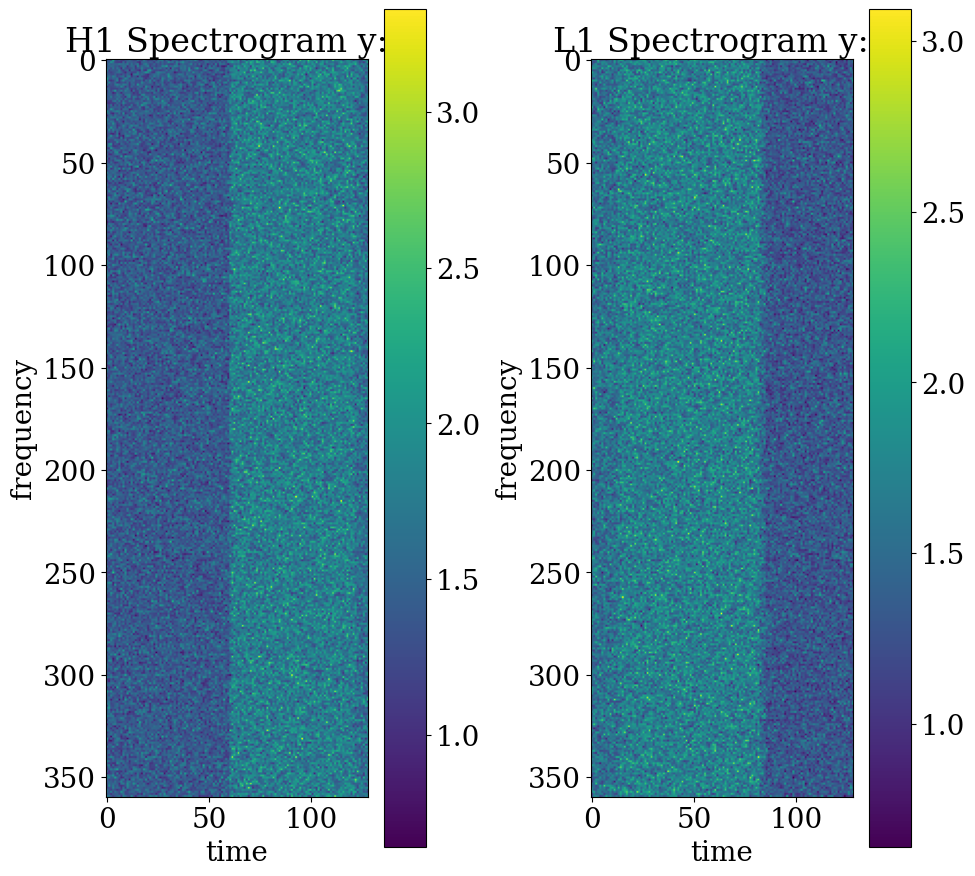

3.3307605 3.0930386


In [15]:
os.makedirs(f"{OUTDIR}/spec_image_sample", exist_ok=True)

h_paths = sorted(glob.glob(f"{OUTDIR}/*segment*.hdf5"))[:5]
for ii, h_path in enumerate(h_paths):
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)
    print("h1_t:", h1_t)
    print("l1_t:", l1_t)
    print("h1_t[0] - l1_t[0]:", h1_t[0] - l1_t[0])

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    #fig_l1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    fig_gap_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    fig_gap_l1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)
    
    #fig_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_h1.png")
    #fig_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_l1.png")
    fig_gap_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_h1.png")
    fig_gap_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_l1.png")
    
    file_id, f, ts_h1, ts_l1, a_h1, a_l1, p_h1, p_l1 = get_hdf5(h_path, 0, 
                                                                is_p_mean=True,
                                                                is_show=True,
                                                                save_dir=f"{OUTDIR}/spec_image_sample",
                                                               )
    print(p_h1.max(), p_l1.max())